# Projektarbeit Felix Romer

In [1]:
#Basics
import numpy as np
import pandas as pd

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

#PCA
from sklearn.decomposition import PCA as sk_pca
from sklearn.preprocessing import StandardScaler, normalize

#Preprocessing
from sklearn import svm
from sklearn.cluster import KMeans
from scipy.signal import savgol_filter

#Regression
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier


#Hilfsskripte
from Preprocessing_aux import *
from plotfunctions import *

%load_ext autoreload
%autoreload 2

## Read CSV File and Cleaning of Data

In [2]:
#Read the File
file = 'Data_5.csv'
df = pd.read_csv(file)

#Generating Wavenumber
delta_Wellenlänge = ((2000-780)/599)
Wellenlänge = list(map(lambda num: round(num, 2), (np.arange(780, (2000 + delta_Wellenlänge), delta_Wellenlänge))))
mein_dim = np.array(Wellenlänge)
df.columns.values[1:601] = Wellenlänge

display(df.head(2))

,Brix,780.0,782.04,784.07,786.11,788.15,790.18,792.22,794.26,796.29,...,1981.67,1983.71,1985.74,1987.78,1989.82,1991.85,1993.89,1995.93,1997.96,2000.0
0,15.5,-1.032355,-1.030551,-1.027970,-1.024937,-1.021866,-1.019143,-1.016866,-1.014910,-1.012907,...,0.692447,0.692944,0.692376,0.690764,0.688081,0.684294,0.679348,0.67324,0.665922,0.657307
1,16.7,-1.139034,-1.137186,-1.134485,-1.131222,-1.127761,-1.124464,-1.121508,-1.118802,-1.115973,...,0.729328,0.728031,0.725548,0.721815,0.716767,0.710405,0.702706,0.69371,0.683480,0.671960


### Extatct relevant inforamtion


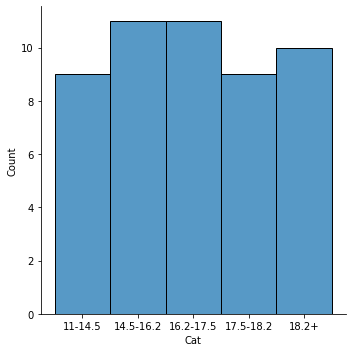

In [3]:
#Brix-Inforamtion
Brix_ = pd.DataFrame(df.iloc[:,0])

#Creating Brix groups for easyer Visualisation
range=[11,14.5,16.2,17.5,18.2,np.inf]
cat_name=['11-14.5', '14.5-16.2', '16.2-17.5', '17.5-18.2', '18.2+']
cat_num = [0,1,2,3,4]
Brix_['Cat']=pd.cut(Brix_['Brix'], bins=range, labels=cat_name)
Brix_['Cat_num'] = pd.cut(Brix_['Brix'], bins=range, labels=cat_num)
sns.displot(Brix_['Cat'])
plt.show()
#Spektrum
Spektrum = df.iloc[:,1:].values.astype(np.float64)

#Wavenumbers
mein_dim = np.array(Wellenlänge)

### Baselinecorrection

In [4]:
#Multiplicative Scatter Correction
X_msc = msc(Spektrum)

#Rubberband Baseline Correction
X_rub = rubberband(X_msc, mein_dim)

#Vetor Normalization
X_norm= normalize(X_rub)

X_pre = msc(X_norm)

# Savitzky-Golay Smoothing
# deriv sagt mit welcher Ableitung gearbeitet wird. Bei erster Ableitung geht Rauschen verloren - Fenster darf nicht zu groß sein, 
# da sonst die Werte heraus geklättet werden!!
w = 15 # window width 15 ist schon ziemlich viel !
p = 2 # polynomial order
X_prepro = savgol_filter(X_pre, w, polyorder = p, deriv=0)
X_prepro_abl1 = savgol_filter(X_pre, w, polyorder = p, deriv=1)
X_prepro_abl2 = savgol_filter(X_pre, w, polyorder = p, deriv=2)
 
df_prepro = pd.DataFrame(X_prepro)
#Überschriften anpassen, sodass sie zu der einzelnen Wellenlänge passen
df_prepro.columns = Wellenlänge
df_prepro.head()

,780.00,782.04,784.07,786.11,788.15,790.18,792.22,794.26,796.29,798.33,...,1981.67,1983.71,1985.74,1987.78,1989.82,1991.85,1993.89,1995.93,1997.96,2000.00
0,-0.026439,-0.026447,-0.026431,-0.026392,-0.026331,-0.026246,-0.026139,-0.026009,-0.025914,-0.025794,...,-0.020090,-0.020363,-0.020738,-0.021246,-0.021859,-0.022576,-0.023397,-0.024323,-0.025353,-0.026487
1,-0.029194,-0.029270,-0.029307,-0.029306,-0.029265,-0.029186,-0.029069,-0.028912,-0.028792,-0.028625,...,-0.020018,-0.020514,-0.021135,-0.021918,-0.022827,-0.023864,-0.025028,-0.026320,-0.027738,-0.029284
2,-0.028122,-0.028181,-0.028210,-0.028206,-0.028171,-0.028104,-0.028006,-0.027876,-0.027780,-0.027646,...,-0.019568,-0.020036,-0.020618,-0.021348,-0.022196,-0.023160,-0.024242,-0.025441,-0.026758,-0.028192
3,-0.026982,-0.027010,-0.027010,-0.026983,-0.026928,-0.026846,-0.026737,-0.026600,-0.026498,-0.026365,...,-0.018692,-0.019120,-0.019664,-0.020356,-0.021169,-0.022102,-0.023155,-0.024329,-0.025624,-0.027039
4,-0.027498,-0.027531,-0.027536,-0.027513,-0.027462,-0.027382,-0.027273,-0.027137,-0.027037,-0.026905,...,-0.019396,-0.019820,-0.020357,-0.021039,-0.021836,-0.022750,-0.023779,-0.024925,-0.026186,-0.027564


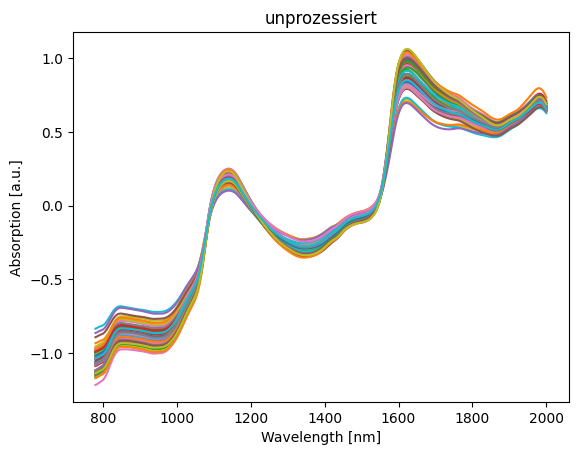

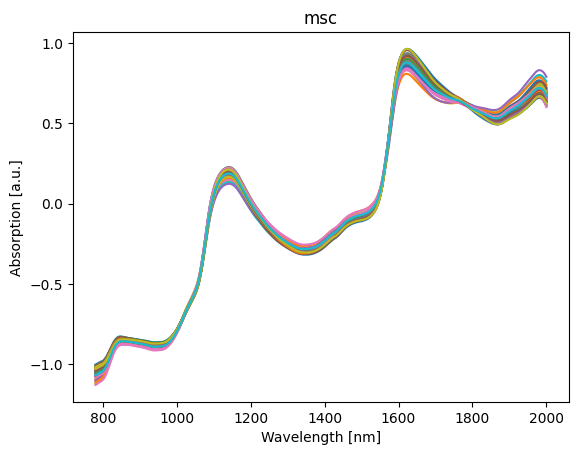

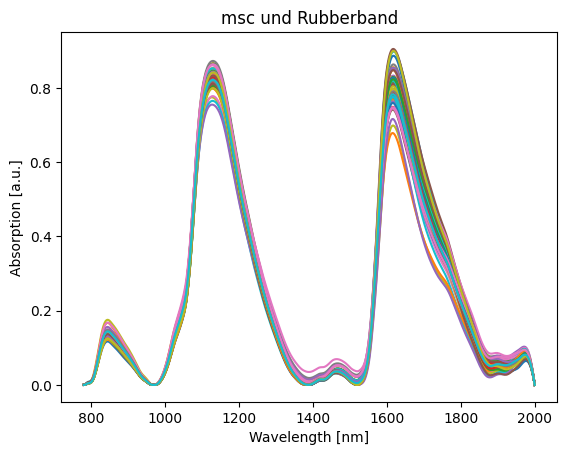

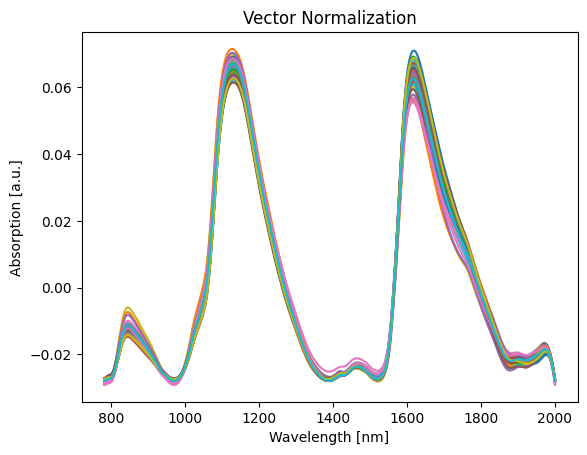

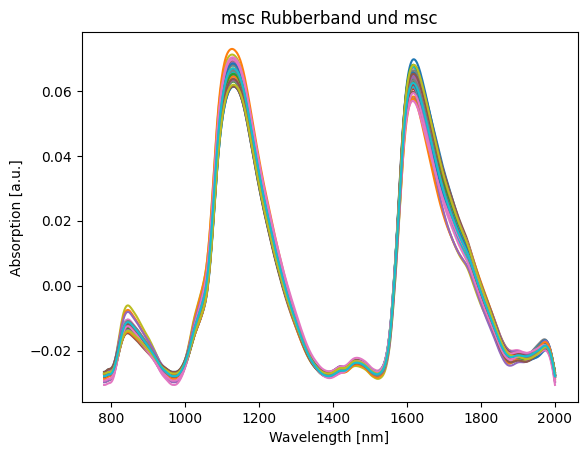

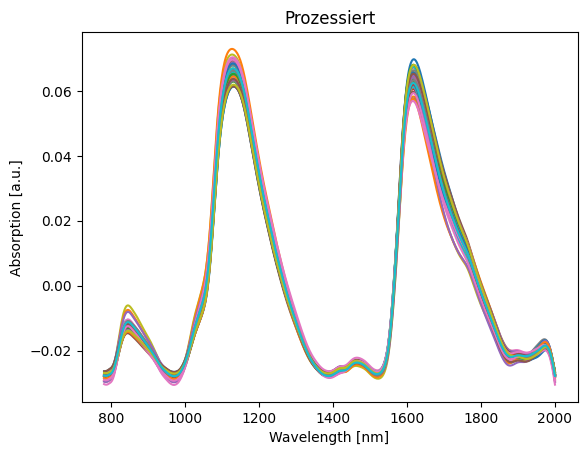

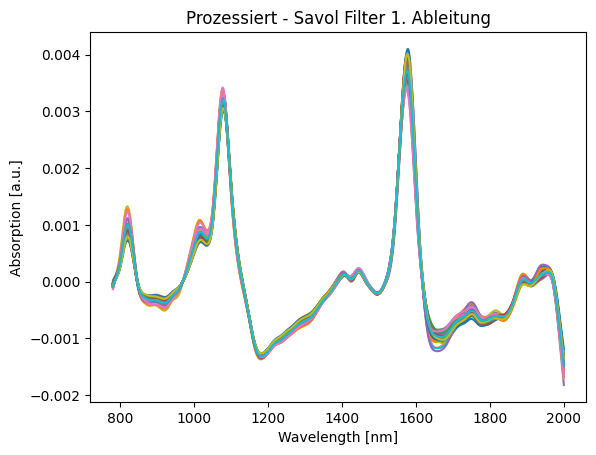

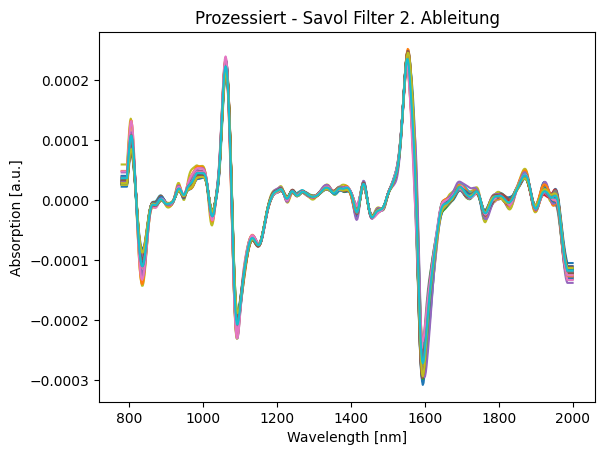

In [5]:
plotspec(Spektrum, mein_dim, 'unprozessiert')

plotspec(X_msc, mein_dim, 'msc')

plotspec(X_rub, mein_dim, 'msc und Rubberband')

plotspec(X_norm, mein_dim, 'Vector Normalization')

plotspec(X_pre, mein_dim, 'msc Rubberband und msc')

plotspec(X_prepro, mein_dim, 'Prozessiert')

plotspec(X_prepro_abl1, mein_dim, 'Prozessiert - Savol Filter 1. Ableitung')

plotspec(X_prepro_abl2, mein_dim, 'Prozessiert - Savol Filter 2. Ableitung')


### PCA

#### Funktion zum erstellen unterschiedlicher PCAs anhand unterschiedlich przessierter Daten

In [6]:
# Standisieren 
def pca_all(abl, scale=True):
    """Creats PCA and related Objekts 
    Args:
        abl(str): Proprocessed DataFrame
        scale(bool, opt): If True scaler is applied, otherwise not
    Returns:
        X_scaled(NumPyArray): Scalled data
        pca(NumPyArray): Data after pca
        loadings(NumPyArray): Loadingsplot 
        loadings_df(DataFrame): formated Loadings Plot as Data Frame
        scores(NumPyArray): Loadingsplot 
        scores_df(DataFrame): formated Loadings Plot as Data Frame"""
    if scale == True:
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(abl)
        
    else:
        X_scaled = abl
        
    #PCA
    PCA = sk_pca(n_components=20)
    pca = PCA.fit(X_scaled)

    #Loadings
    loadings = pca.components_.T
    loadings_df = pd.DataFrame(loadings, columns = ('PC' + str(i) for i in np.arange(1,21))) 
    loadings_df['variable'] = Wellenlänge
    loadings_df = loadings_df.set_index('variable')
    
    #scores
    scores = pca.transform(X_scaled)
    scores_df = pd.DataFrame(scores, columns= ('PC' + str(i) for i in np.arange(1,21)))
    scores_df['Cat']=Brix_['Cat']
    scores_df['Brix']=Brix_['Brix']
    return X_scaled, pca,loadings, loadings_df,scores, scores_df

#### Savitzky-Golay Filter 0. Ableitung

In [7]:
#Mit Scaler
X_scaled, pca,loadings, loadings_df,scores, scores_df = pca_all(X_prepro)

#Ohne Scaler
X_scaled_unscaled, pca_unscaled,loadings_unscaled, loadings_df_unscaled,scores_unscaled, scores_df_unscaled = pca_all(X_prepro, scale=False)

#### Savitzky-Golay Filter 1. Ableitung

In [8]:
#Mit Scaler
X_scaled_1, pca_1,loadings_1, loadings_df_1,scores_1, scores_df_1 = pca_all(X_prepro_abl1)

#Ohne Scaler
X_scaled_unscaled_1, pca_unscaled_1,loadings_unscaled_1, loadings_df_unscaled_1,scores_unscaled_1, scores_df_unscaled_1 = pca_all(X_prepro, scale=False)

#### Savitzky-Golay Filter 2. Ableitung

In [9]:
#Mit Scaler
X_scaled_2, pca_2,loadings_2, loadings_df_2,scores_2, scores_df_2 = pca_all(X_prepro_abl2)

#Ohne Scaler
X_scaled_unscaled_2, pca_unscaled_2,loadings_unscaled_2, loadings_df_unscaled_2,scores_unscaled_2, scores_df_unscaled_2 = pca_all(X_prepro, scale=False)

## Visualisierung

### Scree Plot

In [10]:
#fig= scree_plot(pca)
#fig_un = scree_plot(pca_unscaled)
#fig1= scree_plot(pca_1)
#fig2= scree_plot(pca_2)

### Scores Plot

### Scores Matrix

##### Savitzky-Golay Filter 0. Ableitung scaled

Text(0.5, 1.01, 'Scores Matrix')

<Figure size 12800x9600 with 0 Axes>

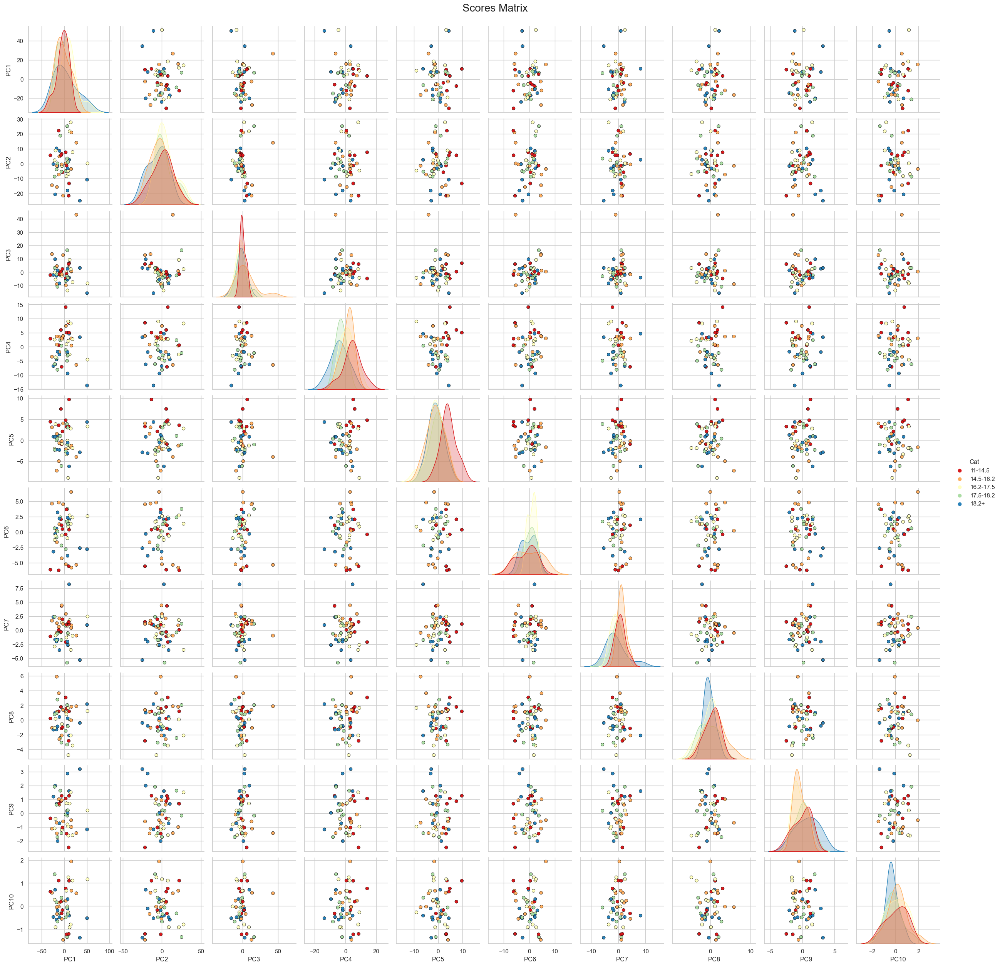

In [11]:
plt.figure(dpi=2000)
sns.set_style('whitegrid')
sns.set_context('notebook')
hue_col=['#d7191c','#fdae61','#ffffbf','#abdda4','#2b83ba']
g=sns.pairplot(scores_df, vars=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], 
                hue='Cat', 
                palette = hue_col, 
                plot_kws=dict(edgecolor="black", linewidth=0.5))

g.fig.suptitle('Scores Matrix', y=1.01, fontsize=20)

##### Savitzky-Golay Filter 0. Ableitung unscaled

Text(0.5, 1.01, 'Scores Matrix unscaled')

<Figure size 7680x5760 with 0 Axes>

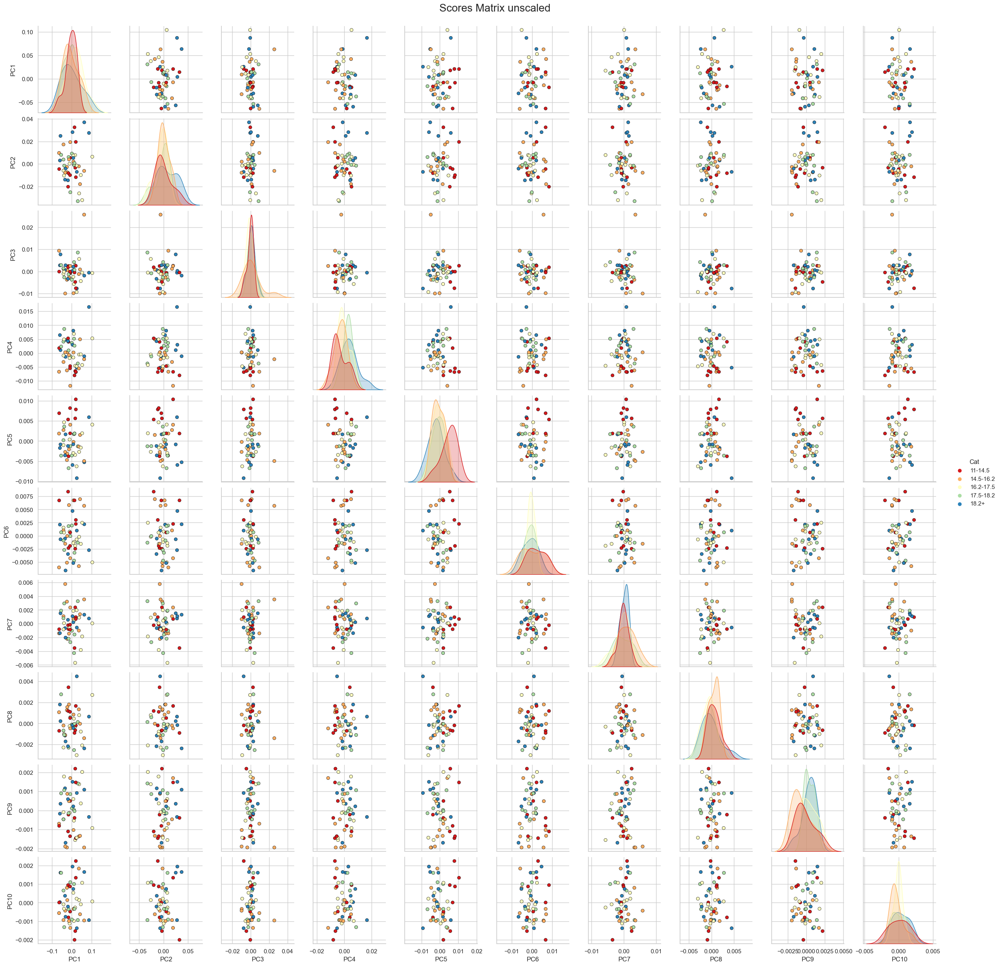

In [12]:
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')
g=sns.pairplot(scores_df_unscaled, vars=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], hue='Cat',
                palette = hue_col, 
                plot_kws=dict(edgecolor="black", linewidth=0.5))
g.fig.suptitle('Scores Matrix unscaled', y=1.01, fontsize=20)

##### Savitzky-Golay Filter 1. Ableitung scaled

Text(0.5, 1.01, 'Scores Matrix Abl1')

<Figure size 7680x5760 with 0 Axes>

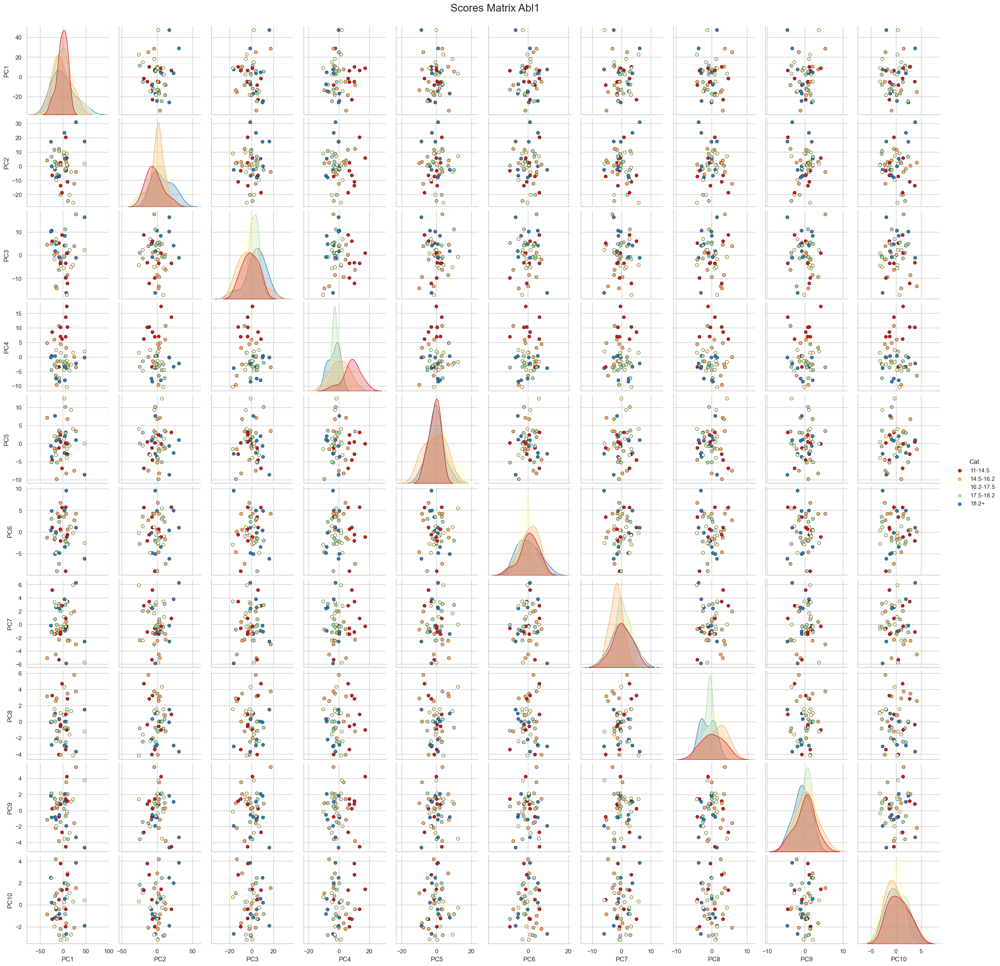

In [13]:
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')
g=sns.pairplot(scores_df_1, vars=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], hue='Cat',
                palette = hue_col, 
                plot_kws=dict(edgecolor="black", linewidth=0.5))
g.fig.suptitle('Scores Matrix Abl1', y=1.01, fontsize=20)

##### Savitzky-Golay Filter 1. Ableitung unscaled

Text(0.5, 1.01, 'Scores Matrix Abl1 unscaled')

<Figure size 7680x5760 with 0 Axes>

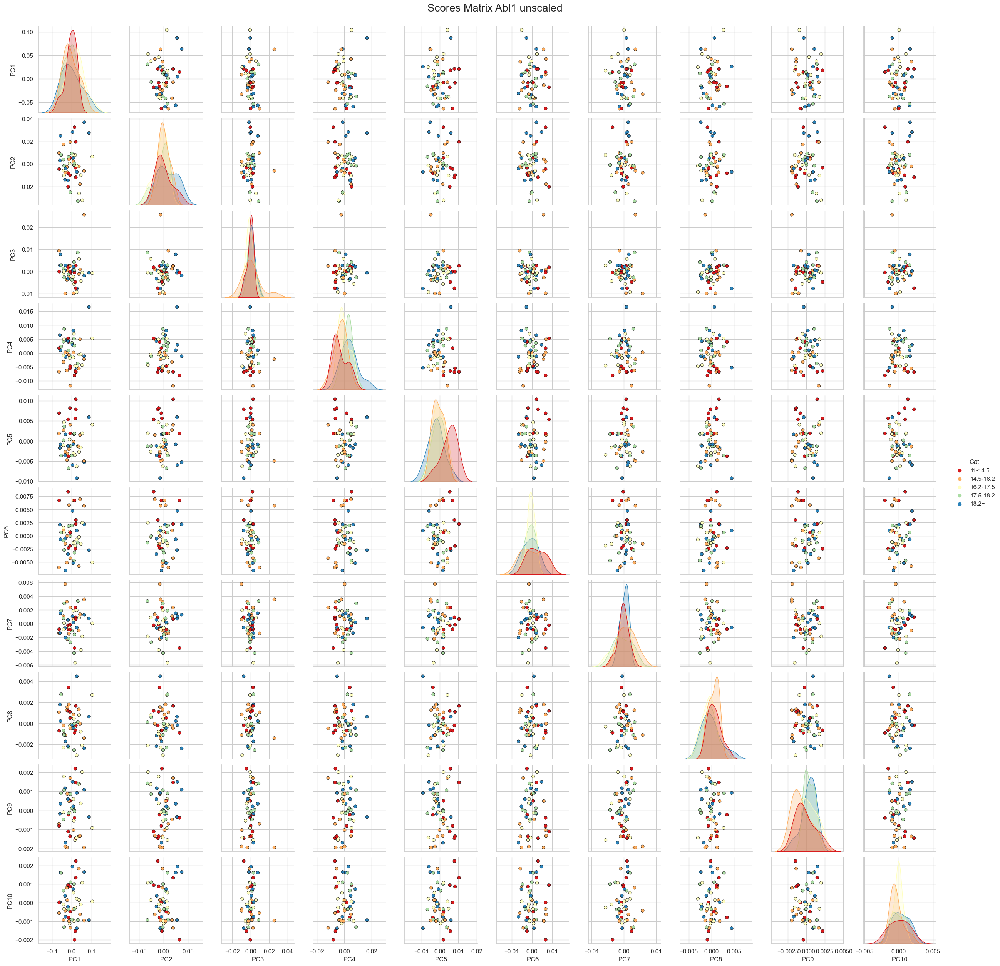

In [14]:
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')
g=sns.pairplot(scores_df_unscaled_1, vars=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], hue='Cat',
                palette = hue_col, 
                plot_kws=dict(edgecolor="black", linewidth=0.5))
g.fig.suptitle('Scores Matrix Abl1 unscaled', y=1.01, fontsize=20)

##### Savitzky-Golay Filter 2. Ableitung scaled

Text(0.5, 1.01, 'Scores Matrix Abl2')

<Figure size 7680x5760 with 0 Axes>

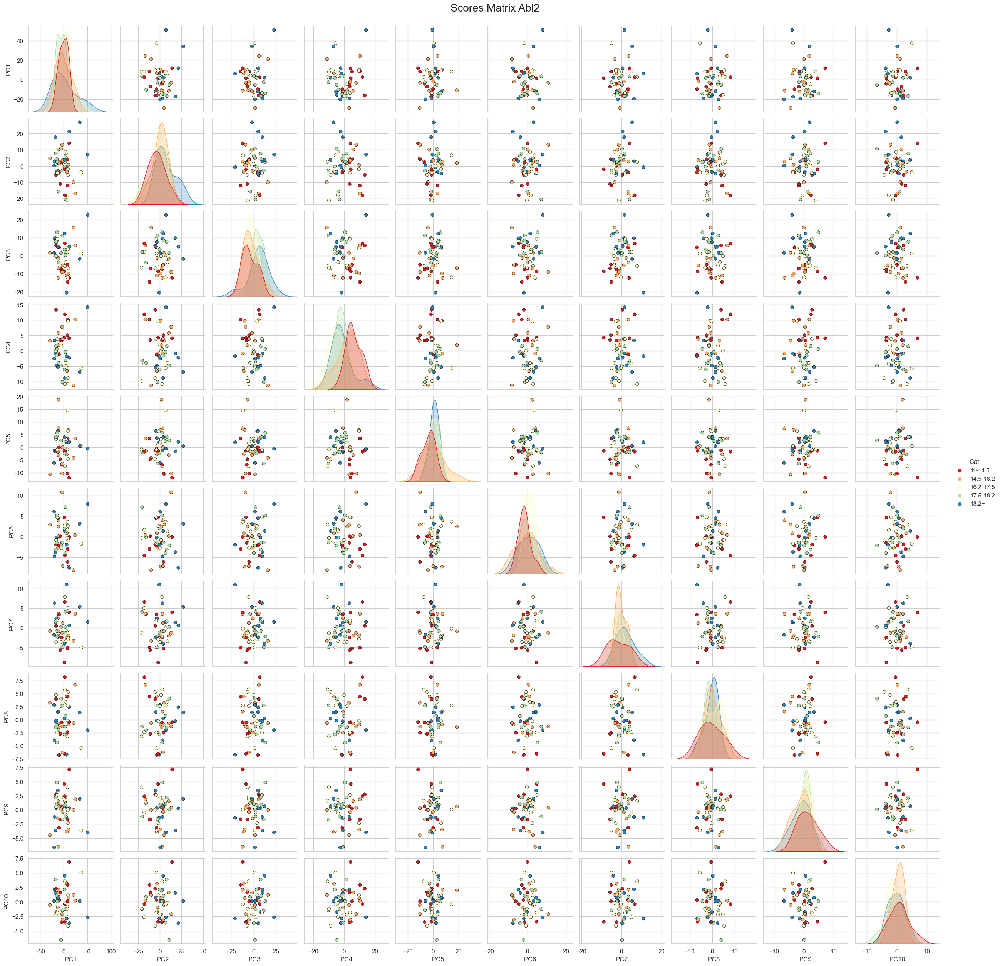

In [15]:
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')
g=sns.pairplot(scores_df_2, vars=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], hue='Cat',
                palette = hue_col, 
                plot_kws=dict(edgecolor="black", linewidth=0.5))
g.fig.suptitle('Scores Matrix Abl2', y=1.01, fontsize=20)


##### Savitzky-Golay Filter 2. Ableitung unscaled

Text(0.5, 1.01, 'Scores Matrix Abl2 unscaled')

<Figure size 7680x5760 with 0 Axes>

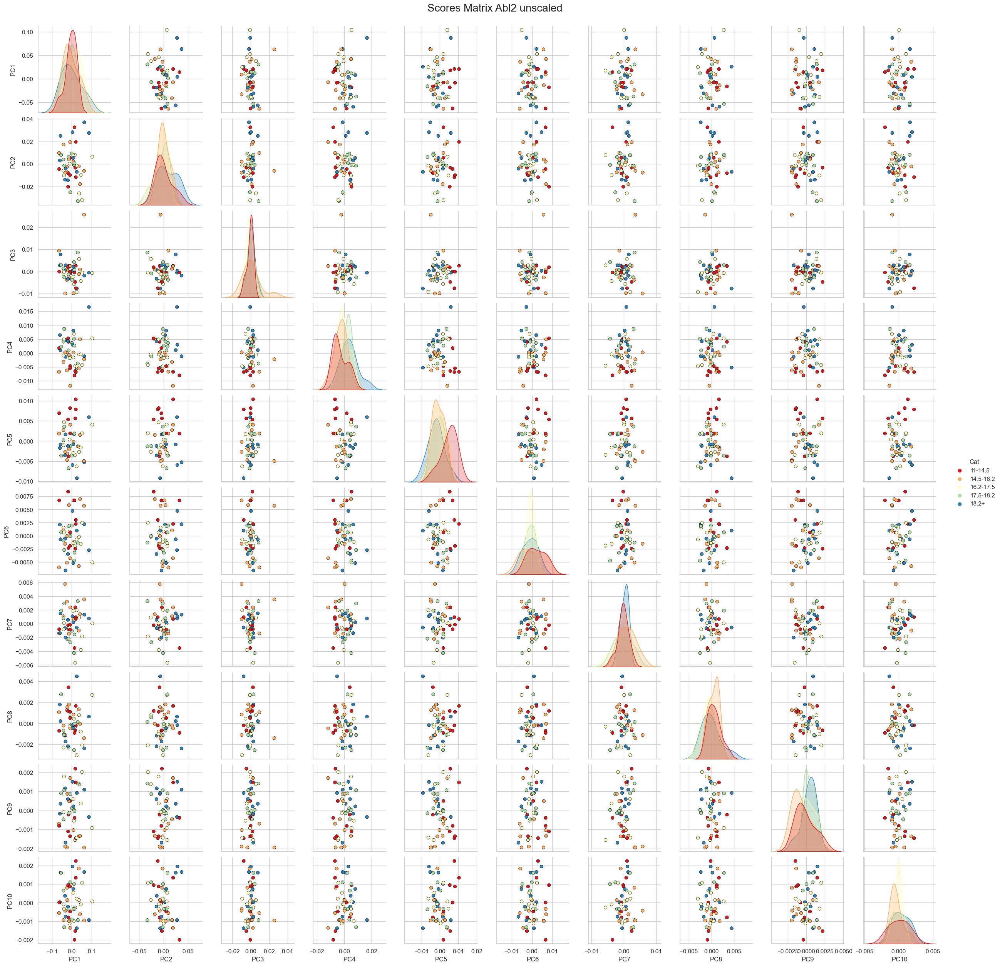

In [16]:
plt.figure(dpi=1200)
sns.set_style('whitegrid')
sns.set_context('notebook')
g=sns.pairplot(scores_df_unscaled_2, vars=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], hue='Cat',
                palette = hue_col, 
                plot_kws=dict(edgecolor="black", linewidth=0.5))
g.fig.suptitle('Scores Matrix Abl2 unscaled', y=1.01, fontsize=20)

### erste Haupt gegen Brix

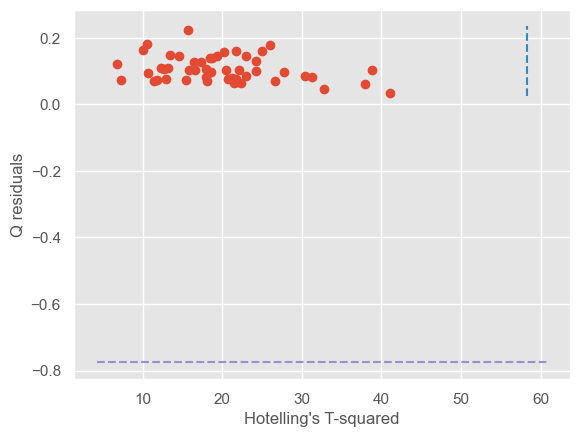

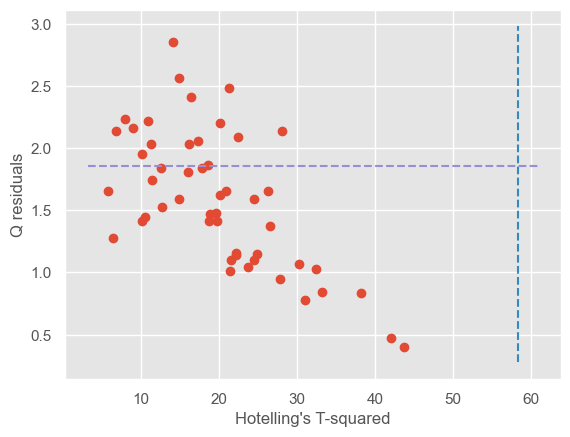

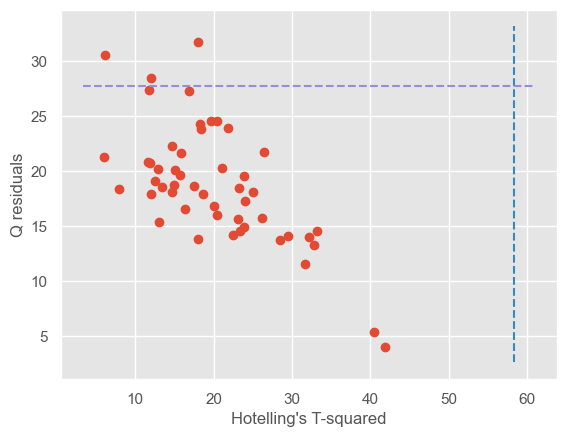

In [17]:
#T2-Q-Plot T2 gibt abstand zum Zentrum der Ebene bei projezierung auf die Eben, Q gibt senkrechten Abstand des Datenpunktes von der Ebene
# hoher t2 und q werte weisst auf abweichungen vom durchschnitt
# linien im default bei 95% Konfidenzinervall
Tsq = Tsq_Q_plot(X_scaled, scores, loadings)

TSQ1=Tsq_Q_plot(X_scaled_1, scores_1, loadings_1)
Tsq2=Tsq_Q_plot(X_scaled_2, scores_2, loadings_2)

## MTL

### Abl2 PC3 und 4

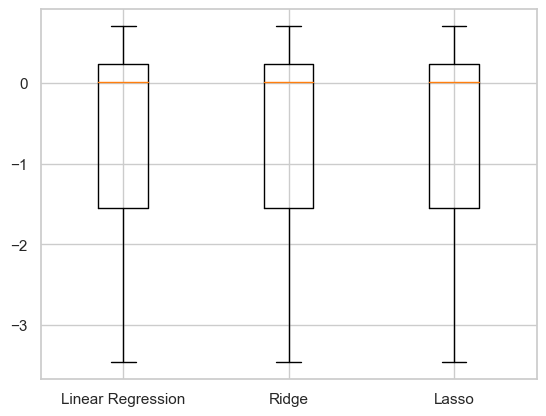

[array([-2.033436  ,  0.27829411,  0.10333611,  0.70617329, -3.4602587 ,
       -0.08949449]), array([-2.03343293,  0.27829432,  0.10333621,  0.70617304, -3.46025428,
       -0.08949482]), array([-2.03278861,  0.27837699,  0.10336796,  0.70609233, -3.45946923,
       -0.08964041])]


In [18]:
#Create X und y with X=Features and y=Target
df_reg = scores_df_2.loc[:,['PC3', 'PC4']]
df_reg['PC3_sqr'] = df_reg.PC3 **2
df_reg['PC4_sqr'] = df_reg.PC4 **2
X=df_reg.values
y = Brix_.Brix.values

#Split data in Train and Test
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)

models = {"Linear Regression": LinearRegression(), "Ridge": Ridge(alpha=0.001), "Lasso": Lasso(alpha=0.001)}
results = []

# Loop through the models' values
for model in models.values():
  kf = KFold(n_splits=6, random_state=42, shuffle=True)
  
  # Perform cross-validation
  cv_scores = cross_val_score(model, X_train, y_train, cv=kf)
  
  # Append the results
  results.append(cv_scores)

# Create a box plot of the results
plt.boxplot(results, labels=models.keys())
plt.show()
print(results)

In [19]:
#Creating of PC3_sqr und PC4_sqr
mtl = scores_df_2.loc[:,['PC3', 'PC4']]
mtl['PC3_sqr'] = mtl.PC3 **2
mtl['PC4_sqr'] = mtl.PC4 **2
mtl['Brix'] = Brix_.Brix
mtl['Brix_Cat'] = Brix_.Cat

# Split the data into training/testing sets
n_test = 10
#Zufällige Testdaten auswählen
np.random.seed(123)
rand_test= np.random.choice(50, n_test, replace=False)

mtl_train = mtl.iloc[~rand_test,:]
mtl_test = mtl.iloc[rand_test,:]
print('Training set size: ', len(mtl) - n_test, 'Test set size: ', n_test)

#Model for Brix_Cat
model=smf.ols('Brix ~ PC3 + PC4 + PC3_sqr + PC4_sqr', data=mtl_train)
results = model.fit()
results.params

Training set size:  40 Test set size:  10


NameError: name 'smf' is not defined

In [ ]:
#

Training set size:  40 Test set size:  10


Intercept    16.972110
PC3           0.190292
PC4          -0.025469
PC3_sqr      -0.008349
PC4_sqr      -0.012918
dtype: float64